In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
from tensorflow.keras.layers import Layer, Conv2D, Conv2DTranspose, BatchNormalization, Dropout, LeakyReLU, ReLU, Concatenate, Input, Flatten, RepeatVector, Reshape, Lambda, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotNormal
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy, MeanAbsoluteError
from tensorflow.keras.metrics import BinaryAccuracy
!pip install tensorflow_io
import tensorflow_io as tfio
from tensorflow.keras.utils import Progbar
from google.colab import drive
import os
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
import cv2
!apt-get install unrar
!unrar x '/content/drive/My Drive/Linnaeus'



Streaming output truncated to the last 5000 lines.
Extracting  Linnaeus 5 256X256/train/other934_256.jpg                     37%  OK 
Extracting  Linnaeus 5 256X256/train/other631_256.jpg                     37%  OK 
Extracting  Linnaeus 5 256X256/train/other966_256.jpg                     37%  OK 
Extracting  Linnaeus 5 256X256/train/bird549_256.jpg                      37%  OK 
Extracting  Linnaeus 5 256X256/train/bird1076_256.jpg                     37%  OK 
Extracting  Linnaeus 5 256X256/train/berry714_256.jpg                     37%  OK 
Extracting  Linnaeus 5 256X256/train/berry328_256.jpg                     37%  OK 
Extracting  Linnaeus 5 256X256/train/bird1112_256.jpg                     37%  OK 
Extracting  Linnaeus 5 256X256/train/flower491_256.jpg                    37%  OK 
Extracting  Linnaeus 5 256X256/train/bird745_256.jpg                      37%  OK 
Extracting  Linnaeus 5 256X25

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
DIRECTORY = 'Linnaeus 5 256X256/train'  # Path adjusted to include train directory directly


data = []
max_num_images = 1000  # Reduced for quick testing; adjust as needed
for num, image in enumerate(os.listdir(DIRECTORY)):
    if image.endswith('.jpg'):  # Ensuring only jpg files are processed
        image_path = os.path.join(DIRECTORY, image)
        try:
            data.append(img_to_array(load_img(image_path)))
            if num + 1 == max_num_images:
                break
        except FileNotFoundError as e:
          print(image)
          print(f"Error: {e}")
data = np.array(data)

NUM_IMAGES = len(data)
print(f'Images Found: {NUM_IMAGES}')

idx = np.random.permutation(NUM_IMAGES)
train_data = data[idx[:6]]  # For example, 60% for training
test_data = data[idx[6:]]   # For example, 40% for testing

print(f'Number of training images: {len(train_data)}, Number of testing images: {len(test_data)}')





Images Found: 1000
Number of training images: 6, Number of testing images: 994


In [ ]:
print(data.shape)

(1000, 256, 256, 3)


ValueError: num must be an integer with 1 <= num <= 10, not 11

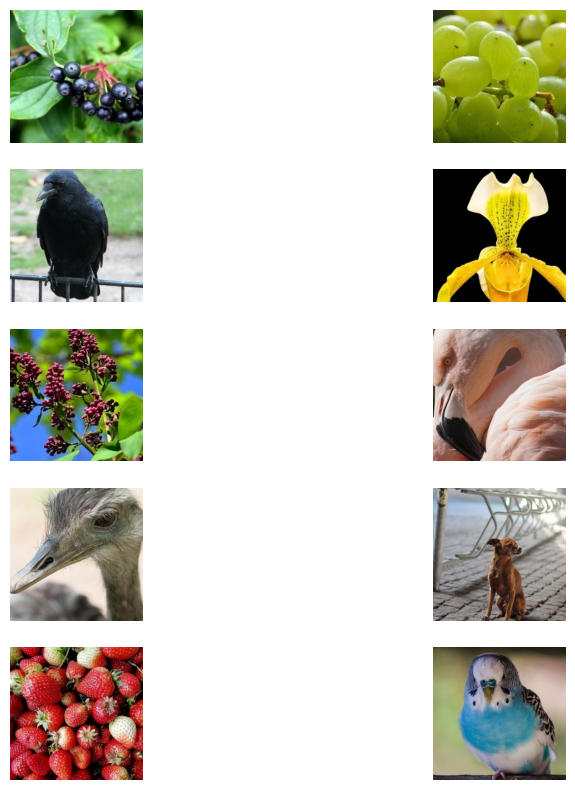

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
# Adjust the subplot parameters to fit 10 images, using a 5x2 grid for example.
for i, image in enumerate(data):
    ax = plt.subplot(5, 2, i+1)
    plt.imshow(image / 255.0)
    plt.axis("off")
plt.show()



In [ ]:
# SUKRIT CODE

import random
import numpy as np
import cv2
import matplotlib.pyplot as plt

def get_quadrant_coordinates(quadrant):
    if quadrant == 1:
        return (0, 128, 0, 128)
    elif quadrant == 2:
        return (0, 128, 128, 256)
    elif quadrant == 3:
        return (128, 256, 0, 128)
    elif quadrant == 4:
        return (128, 256, 128, 256)

def select_patch(image, quadrant, patch_size):
    x_start, x_end, y_start, y_end = get_quadrant_coordinates(quadrant)
    max_x = x_end - patch_size
    max_y = y_end - patch_size
    x = random.randint(x_start, max_x)
    y = random.randint(y_start, max_y)
    patch = image[x:x+patch_size, y:y+patch_size, :]  # Extract all 3 channels
    return patch, (x, y)

def create_patched_image(image):
    patched_image = np.zeros_like(image)

    # Process each quadrant (1 to 4)
    for quadrant in range(1, 5):
        patch, coord = select_patch(image, quadrant, 100)
        patched_image[coord[0]:coord[0]+100, coord[1]:coord[1]+100, :] = patch

    return patched_image

def destroy_images(images):
    patched_images = np.array([create_patched_image(image) for image in images])

    return patched_images


image_paths = [
    "./content/drive/My Drive/Linnaeus/test/berry1_256.jpg",
    "./content/drive/My Drive/Linnaeus/test/berry2_256.jpg",
    "./content/drive/My Drive/Linnaeus/test/berry3_256.jpg",
    "./content/drive/My Drive/Linnaeus/test/berry4_256.jpg",
    "./content/drive/My Drive/Linnaeus/test/berry5_256.jpg"
]

images = []
for path in image_paths:
    img = cv2.imread(path)
    if img is not None:
        img = cv2.resize(img, (256, 256))
        images.append(img)
images = np.array(images)
patched_images = destroy_images(images)
for idx, (original, patched) in enumerate(zip(images, patched_images)):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title(f"Original Image {idx + 1}")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(patched, cv2.COLOR_BGR2RGB))
    plt.title(f"Patched Image {idx + 1}")
    plt.axis("off")
    plt.show()

IMAGE GENERATOR

In [ ]:
image_generator = ImageDataGenerator(
    rotation_range=20,
    horizontal_flip=True
)

IMG_DIM = (256, 256)
BATCH_SIZE = 32

def dataset_generator(directory=data, batch_size=BATCH_SIZE):
    for image_batch in image_generator.flow(data, batch_size=batch_size):
      # resize images

      image_batch = tf.image.resize(image_batch, IMG_DIM)

      # normalize pixel values
      bad_images = tf.cast(destroy_images(image_batch),dtype=tf.float32)/255.0
      good_images = tf.cast(image_batch,dtype=tf.float32)/255.0

      print(bad_images.shape)
      print(good_images.shape)

      # convert to lab space
      bad_images_lab = tfio.experimental.color.rgb_to_lab(bad_images, illuminant='D65', observer='2') / 128.0
      good_images_lab = tfio.experimental.color.rgb_to_lab(good_images, illuminant='D65', observer='2') / 128.0

      yield bad_images_lab, good_images_lab




In [ ]:
dataset_generator(DIRECTORY)


<generator object dataset_generator at 0x7a16a82c1930>

## U-Net Encoding Layer

In [ ]:
class UNetEncLayer(Layer):
  def __init__(self, index, batch_normalize=True, **kwargs):
    super(UNetEncLayer, self).__init__(name=f'UNetEnc_{index}')
    self.conv_layer = Conv2D(**kwargs, name=f'Conv_{index}_Enc')
    self.batch_norm_layer = BatchNormalization(name=f'Batch_Norm_{index}_Enc')
    self.activation = LeakyReLU(alpha=0.2,name=f'Act_{index}_Enc')
    self.batch_normalize = batch_normalize

  def call(self, input):
    x = self.conv_layer(input)
    if self.batch_normalize:
      x = self.batch_norm_layer(x)
    x = self.activation(x)
    return x

## U-Net Decoding Layer

In [ ]:
class UNetDecLayer(Layer):
  def __init__(self, index, batch_normalize=True, **kwargs):
    super(UNetDecLayer, self).__init__(name=f'UNetDec_{index}')
    self.concat_layer = Concatenate(axis=-1)
    self.conv_trans_layer = Conv2DTranspose(**kwargs, name=f'Conv_Trans_{index}_Dec')
    self.batch_norm_layer = BatchNormalization(name=f'Batch_Norm_{index}_Dec')
    self.activation = ReLU(name=f'Act_{index}_Dec')
    self.batch_normalize = batch_normalize

  def call(self, enc_features, dec_input):
    x = self.conv_trans_layer(dec_input)
    x = self.concat_layer([enc_features, x])
    if self.batch_normalize:
      x = self.batch_norm_layer(x)
    x = self.activation(x)
    return x

## Encoder Architecture

In [ ]:
IMG_DIM = (256,256)
inp_layer = Input(IMG_DIM+(3,))
enc_1 = UNetEncLayer(1,batch_normalize=False,filters=64,kernel_size=(4,4),padding='same',strides=(1,1),kernel_initializer=GlorotNormal())(inp_layer)

filters_for_enc = [64,128,256,512,512,512,512]
enc_layers = [enc_1]
x = enc_1
for i, filters in enumerate(filters_for_enc):
  x = UNetEncLayer(i+2,filters=filters,kernel_size=(4,4),padding='same',strides=(2,2),kernel_initializer=GlorotNormal())(x)
  enc_layers.append(x)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'UNetEnc_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


## Resnet Fusion

In [ ]:
resnet50_model = ResNet50(include_top=False, weights='imagenet')
truncated_model = tf.keras.Model(inputs = resnet50_model.input, outputs = resnet50_model.layers[-48].output, name='TruncatedResnet50')
truncated_model.trainable = False
preprocess_layer = Lambda(resnet_preprocess, input_shape=(256, 256, 3))(inp_layer)
resnet50_output = truncated_model(preprocess_layer, training=False)
conv_resent50_output = Conv2DTranspose(filters=256,kernel_size=(2,2), strides=(2,2),activation='relu')(resnet50_output)

fusion_input = Input(shape=[1000], name='FusionInput')

repeat_layer = RepeatVector(32*32, name='RepeatLayer')(fusion_input)
reshape_layer = Reshape([32,32,1000], name='ReshapeLayer')(repeat_layer)
conc_layer = concatenate([conv_resent50_output, reshape_layer], axis=3)

fusion_output = Conv2D(filters=256, kernel_size=(1,1), strides=(1,1), padding='same',  activation='relu',
              name='Conv2D_LayerF1')(conc_layer)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/lambda_layer.py:65: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


## Decoder Architecture

In [ ]:
filters_for_dec = [512,512,512,256,128,64,64]
x = enc_layers[-1]
for i, filters in enumerate(filters_for_dec):
  x = UNetDecLayer(i+1,filters=filters,kernel_size=(4,4),padding='same',strides=(2,2),kernel_initializer=GlorotNormal())(enc_layers[-i-2],x)

out_layer = Conv2D(filters=3,kernel_size=(4,4),padding='same',strides=(1,1),kernel_initializer=GlorotNormal(),activation=tf.nn.tanh,name='GenOut')(x)

## Generator Model

In [ ]:
generator = Model(inp_layer, out_layer,name='Generator')
generator.summary()

Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetEnc_1 (UNetEncLayer)  │ (None, 256, 256, 64)   │          3,136 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetEnc_2 (UNetEncLayer)  │ (None, 128, 128, 64)   │         65,856 │ UNetEnc_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetEnc_3 (UNetEncLayer)  │ (None, 64, 64, 128)    │        131,712 │ UNetEnc_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetEnc_4 (UNetEncLayer)  │ (None, 32, 32, 256)    │        525,568 │ UNetEnc_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetEnc_5 (UNetEncLayer)  │ (None, 16, 16, 512)    │      2,099,712 │ UNetEnc_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetEnc_6 (UNetEncLayer)  │ (None, 8, 8, 512)      │      4,196,864 │ UNetEnc_5[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetEnc_7 (UNetEncLayer)  │ (None, 4, 4, 512)      │      4,196,864 │ UNetEnc_6[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetEnc_8 (UNetEncLayer)  │ (None, 2, 2, 512)      │      4,196,864 │ UNetEnc_7[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetDec_1 (UNetDecLayer)  │ (None, 4, 4, 1024)     │      4,198,912 │ UNetEnc_7[0][0],       │
│                           │                        │                │ UNetEnc_8[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetDec_2 (UNetDecLayer)  │ (None, 8, 8, 1024)     │      8,393,216 │ UNetEnc_6[0][0],       │
│                           │                        │                │ UNetDec_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetDec_3 (UNetDecLayer)  │ (None, 16, 16, 1024)   │      8,393,216 │ UNetEnc_5[0][0],       │
│                           │                        │                │ UNetDec_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetDec_4 (UNetDecLayer)  │ (None, 32, 32, 512)    │      4,196,608 │ UNetEnc_4[0][0],       │
│                           │                        │                │ UNetDec_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetDec_5 (UNetDecLayer)  │ (None, 64, 64, 256)    │      1,049,728 │ UNetEnc_3[0][0],       │
│                           │                        │                │ UNetDec_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetDec_6 (UNetDecLayer)  │ (None, 128, 128, 128)  │        262,720 │ UNetEnc_2[0][0],       │
│                           │                        │                │ UNetDec_5[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ UNetDec_7 (UNetDecLayer)  │ (None, 256, 256, 128)  │        131,648 │ UNetEnc_1[0][0],       │
│                      

 Total params: 42,048,771 (160.40 MB)

 Trainable params: 42,035,587 (160.35 MB)

 Non-trainable params: 13,184 (51.50 KB)

### Testing

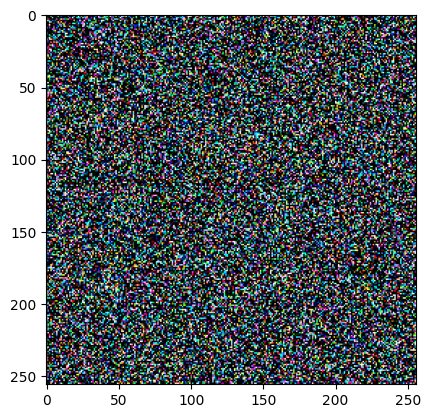

In [ ]:
test_inp = 2*(np.random.rand(1,256,256,3)-0.5)
test_out = generator(test_inp)
gen_img = tf.squeeze(tf.concat([test_inp, test_out], axis=-1))
gen_img_rgb = tfio.experimental.color.lab_to_rgb(gen_img*128, illuminant='D65', observer='2')
plt.imshow(gen_img_rgb)

## Discriminator Layer

In [ ]:
class DiscLayer(Layer):
  def __init__(self, index, batch_normalize=True, **kwargs):
    super(DiscLayer, self).__init__(name=f'DiscBlock_{index}')
    self.conv_layer = Conv2D(**kwargs, name=f'Conv_{index}_Disc')
    self.batch_norm_layer = BatchNormalization(name=f'Batch_Norm_{index}_Disc')
    self.activation = LeakyReLU(alpha=0.2,name=f'Act_{index}_Disc')
    self.batch_normalize = batch_normalize

  def call(self, input):
    x = self.conv_layer(input)
    if self.batch_normalize:
      x = self.batch_norm_layer(x)
    x = self.activation(x)
    return x

In [ ]:
disc_inp_layer = Input(IMG_DIM+(3,))
disc_1 = DiscLayer(1,batch_normalize=False,filters=64,kernel_size=(4,4),padding='same',strides=(1,1),kernel_initializer=GlorotNormal())(disc_inp_layer)

filters_for_disc = [64,128,256,512,512,512]
disc_layers = [disc_1]
x = disc_1
for i, filters in enumerate(filters_for_disc):
  x = DiscLayer(i+2,filters=filters,kernel_size=(4,4),padding='same',strides=(2,2),kernel_initializer=GlorotNormal())(x)
  disc_layers.append(x)

disc_out_layer = Conv2D(filters=1, kernel_size=(4,4),padding='same',strides=(1,1),kernel_initializer=GlorotNormal(),activation=tf.nn.sigmoid,name='DiscOut')(x)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:391: UserWarning: `build()` was called on layer 'DiscBlock_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


In [ ]:
discriminator = Model(disc_inp_layer, disc_out_layer,name='Discriminator')
discriminator.summary()

Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ DiscBlock_1 (DiscLayer)              │ (None, 256, 256, 64)        │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ DiscBlock_2 (DiscLayer)              │ (None, 128, 128, 64)        │          65,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ DiscBlock_3 (DiscLayer)              │ (None, 64, 64, 128)         │         131,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ DiscBlock_4 (DiscLayer)              │ (None, 32, 32, 256)         │         525,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ DiscBlock_5 (DiscLayer)              │ (None, 16, 16, 512)         │       2,099,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ DiscBlock_6 (DiscLayer)              │ (None, 8, 8, 512)           │       4,196,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ DiscBlock_7 (DiscLayer)              │ (None, 4, 4, 512)           │       4,196,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ DiscOut (Conv2D)                     │ (None, 4, 4, 1)             │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,227,905 (42.83 MB)

 Trainable params: 11,223,937 (42.82 MB)

 Non-trainable params: 3,968 (15.50 KB)

## Optimizers

In [ ]:
lr = 0.0001
beta_1 = 0.5
gen_opt = Adam(learning_rate=lr, beta_1=beta_1)
disc_opt = Adam(learning_rate=lr, beta_1=beta_1)

## Loss functions

In [ ]:
cross_entropy = BinaryCrossentropy()
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output)*0.9, real_output) # one sided label smoothing
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [ ]:
mae = MeanAbsoluteError()
def generator_loss(fake_output, actual_images, gen_images, lambda_=100):
    gan_loss = -1*cross_entropy(tf.zeros_like(fake_output), fake_output) # modified loss heuristic
    l1_loss = mae(actual_images, gen_images)
    return gan_loss + lambda_*l1_loss

## GAN Training

In [ ]:
@tf.function
def train_step(bad_images, real_images, print_scores=False):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      gen_images = generator(bad_images, training=True)

      real_output = discriminator(real_images, training=True)
      fake_output = discriminator(gen_images, training=True)

      gen_loss = generator_loss(fake_output,real_images,gen_images)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    gen_opt.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    disc_opt.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    if(print_scores):
      tf.print('gen_loss:',end=' ')
      tf.print(gen_loss,end=' ')
      tf.print('disc_loss:',end=' ')
      tf.print(disc_loss,end=' ')
      tf.print('loss:',end=' ')
      tf.print(gen_loss+disc_loss,end=' ')
      tf.print('mae:',end=' ')
      tf.print(tf.reduce_mean(tf.abs(real_images-gen_images)),end=' ')
      tf.print('mse:',end=' ')
      tf.print(tf.reduce_mean(tf.square(real_images-gen_images)),end=' ')
      tf.print('psnr:',end=' ')
      tf.print(tf.reduce_mean(tf.image.psnr(real_images,gen_images,max_val=1)))

In [ ]:
num_steps = 50
def train_model(num_epochs):
  for epoch in range(num_epochs):
    print(f'Epoch {epoch+1}/{num_epochs}: ',end='')
    prog_bar = Progbar(num_steps)
    for step, (bw_images, ab_images) in enumerate(dataset_generator(DIRECTORY)):
      train_step(bw_images, ab_images,step==num_steps)
      if step==num_steps:
        break
      prog_bar.add(1)


In [ ]:
train_model(num_epochs=50)

Streaming output truncated to the last 5000 lines.
(32, 256, 256, 3)
48/50 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step(32, 256, 256, 3)
(32, 256, 256, 3)
49/50 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step(32, 256, 256, 3)
(32, 256, 256, 3)
50/50 ━━━━━━━━━━━━━━━━━━━━ 113s 2s/step
(32, 256, 256, 3)
(32, 256, 256, 3)
gen_loss: 9.45711 disc_loss: 0.335465461 loss: 9.79257584 mae: 0.0946163908 mse: 0.0170309115 psnr: 18.0096378
Epoch 3/50: (32, 256, 256, 3)
(32, 256, 256, 3)
 1/50 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step(32, 256, 256, 3)
(32, 256, 256, 3)
 2/50 ━━━━━━━━━━━━━━━━━━━━ 1:45 2s/step(32, 256, 256, 3)
(32, 256, 256, 3)
 3/50 ━━━━━━━━━━━━━━━━━━━━ 1:44 2s/step(32, 256, 256, 3)
(32, 256, 256, 3)
 4/50 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step(32, 256, 256, 3)
(32, 256, 256, 3)
 5/50 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step(32, 256, 256, 3)
(32, 256, 256, 3)
 6/50 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step(32, 256, 256, 3)
(32, 256, 256, 3)
 7/50 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step(32, 256, 256, 3)
(32, 256, 256, 3)
 8/50 ━━━━━━━━━━━━━━━━━━━

VIZUALIZATION WITH TEST DATA

In [ ]:
small_test = test_data[:25] # first 25

def feed_images_for_test():
    # Preprocessing for the generator
    ### Resize
    diff_test = tf.image.resize(small_test, IMG_DIM)

    ## Normalization of pixel values
    bad_images = tf.cast(destroy_images(diff_test) , dtype=tf.float32)/255

    ## send bad images to the generator which returns output in l*a*b*
    bad_images_lab = tfio.experimental.color.rgb_to_lab(bad_images, illuminant='D65', observer='2')/128
    generator_out = generator(bad_images_lab, training = False) *  128

    ## to rgb
    generator_out_rgb = tfio.experimental.color.lab_to_rgb(generator_out, illuminant='D65', observer='2')

    return bad_images, generator_out_rgb


def visualize():
  num_img_for_vis = 25
  num_cols = 3

  bad_images, generator_images = feed_images_for_test()
  _, ax = plt.subplots(num_img_for_vis, num_cols, figsize=(25,100))
  for i in range(num_img_for_vis):
      ax[i][0].imshow(bad_images[i])
      ax[i][0].title.set_text('Bad Image '+ str(i+1))
      ax[i][1].imshow(generator_images[i])
      ax[i][1].title.set_text('Generated Image' + str(i+1))
      ax[i][2].imshow(small_test[i]/255)
      ax[i][2].title.set_text('Actual Image' + str(i+1))
      name = '/content/drive/My Drive/RES/'
      tf.keras.utils.save_img(name+'gen'+str(i+1)+'.png',generator_images[i])
      tf.keras.utils.save_img(name+'bad'+str(i+1)+'.png',bad_images[i])
      tf.keras.utils.save_img(name+'actual'+str(i+1)+'.png',small_test[i])

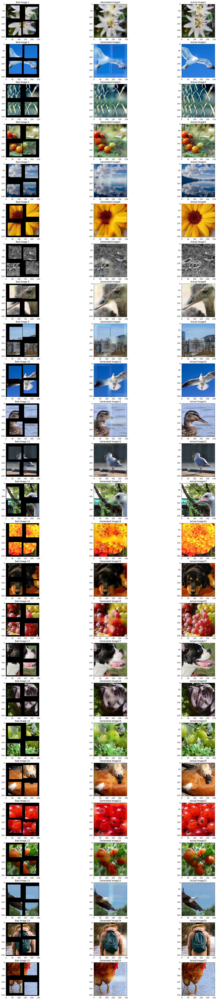

In [ ]:
visualize()

In [ ]:
print(small_test)

[[[[ 29.  26.   7.]
   [ 26.  23.   4.]
   [ 25.  20.   1.]
   ...
   [ 53.  52.  48.]
   [ 68.  67.  62.]
   [ 76.  77.  71.]]

  [[ 31.  28.  11.]
   [ 27.  24.   7.]
   [ 25.  19.   3.]
   ...
   [ 50.  46.  43.]
   [ 62.  61.  56.]
   [ 72.  73.  67.]]

  [[ 21.  19.   6.]
   [ 20.  18.   5.]
   [ 21.  18.   3.]
   ...
   [ 36.  32.  29.]
   [ 42.  38.  35.]
   [ 47.  46.  42.]]

  ...

  [[ 30.  50.  61.]
   [ 34.  54.  63.]
   [ 42.  61.  68.]
   ...
   [ 40.  46.  32.]
   [ 51.  54.  43.]
   [ 65.  67.  56.]]

  [[ 28.  50.  61.]
   [ 32.  55.  63.]
   [ 41.  60.  66.]
   ...
   [ 37.  43.  31.]
   [ 47.  50.  39.]
   [ 61.  63.  52.]]

  [[ 29.  53.  63.]
   [ 32.  55.  63.]
   [ 42.  61.  67.]
   ...
   [ 29.  35.  23.]
   [ 39.  41.  30.]
   [ 52.  54.  43.]]]


 [[[  1. 104. 199.]
   [  1. 104. 199.]
   [  1. 104. 199.]
   ...
   [ 11. 109. 206.]
   [ 11. 109. 206.]
   [ 11. 109. 206.]]

  [[  1. 104. 199.]
   [  1. 104. 199.]
   [  1. 104. 199.]
   ...
   [ 11. 109. 206.]
 

In [ ]:
@tf.function
def our_psnr(x,y):
  return tf.image.psnr(x,y,2);

generator.compile(loss=['mae'],metrics=['mae','mse','acc',our_psnr])
test_res = generator.evaluate(dataset_generator(test_data),steps=10)

In [ ]:
generator.save_weights('/content/drive/My Drive/generator3.weights.h5')
discriminator.save_weights('/content/drive/My Drive/discriminator3.weights.h5')